# Notebook 27 — Modèle couleur : **influence de la couleur sur l'état thermique**

## Le problème posé

Deux surfaces du **même matériau** peuvent avoir des comportements thermiques radicalement différents selon leur seule couleur :

| Exemple | Matériau | Couleur | Absorption solaire | Échauffement |
|---|---|---|---|---|
| Mur peint blanc | béton + peinture | blanc | ~0,20 | **+8 °C** |
| Mur peint noir | béton + peinture | noir | ~0,95 | **+50 °C** |

Même béton, même géométrie, même ensoleillement → **42 °C d'écart** dû à la seule couleur. Idem pour une voiture blanche vs noire, un vêtement clair vs foncé, une chaussée claire vs sombre.

C'est cette dimension que les modèles sémantique (*quel objet ?*) et matériaux (*quelle matière ?*) ne capturent pas.

## Chaîne physique modélisée

```
couleur (L* CIELAB)  →  absorption solaire α  →  échauffement ΔT de la surface
```

**Étape 1 — Couleur → absorption solaire**
Pour une surface opaque : `α = 1 − ρ` (absorption = 1 − réflectance solaire).
Ancrages mesurés :
- Blanc (L*≈90) : ρ ≈ 0,80 → **α ≈ 0,20**
- Noir standard (L*≈15) : ρ ≈ 0,05 → **α ≈ 0,95**
- Couleurs sombres (brun, gris, noir) : α mesuré entre **0,80 et 0,95** (Ramos et al.)

**Étape 2 — Absorption → échauffement**
Ancrages de la norme **ASTM E1980** (définition du SRI), conditions standard (1000 W/m², vent faible, ε = 0,90) :
- Toiture **noire** standard : ΔT ≈ **+50 °C** au-dessus de l'air
- Toiture **blanche** standard : ΔT ≈ **+8 °C**

Le SRI étant défini par interpolation linéaire de l'échauffement entre ces deux standards, on utilise la même interpolation.

## Sorties du modèle

1. **Catégorie de teinte nommée** par pixel : `blanc / clair / moyen / foncé / noir`
2. **Absorption solaire α** continue (0–1) par pixel
3. **Échauffement ΔT** estimé (°C au-dessus de l'air ambiant)
4. Analyse : quelles surfaces du quartier chauffent le plus **à cause de leur couleur**

⚠️ Ce notebook est **indépendant** du nb25 : il produit sa propre analyse thermique, il ne modifie pas la fusion matériaux.

## Sources

| Réf | Source | Lien |
|---|---|---|
| T1 | ASTM E1980 (SRI) — standards noir ρ=0,05/ΔT≈50 °C, blanc ρ=0,80/ΔT≈8 °C | https://image-ppubs.uspto.gov/dirsearch-public/print/downloadPdf/9556361 |
| T2 | Ramos et al. — *NIR reflective Paints for Sustainable Façade Renovation* : couleurs sombres α = 0,80–0,95 ; seuil de sécurité α < 0,70 / T < 80 °C | https://www.eeagrants-2014-2021.gov.pt/media/7438/8-nsb-2023-p3.pdf |
| T3 | *Determination of the solar absorptance of opaque surfaces* (PLEA 2007) — mesures d'absorptance, effet rugosité et vieillissement | https://www.researchgate.net/publication/280041642_Determination_of_the_solar_absorptance_of_opaque_surfaces |
| T4 | Peintures noires NIR : TSR passe de 5 % (noir standard) à >30 % (noir réfléchissant) à couleur visible identique | https://www.researchgate.net/publication/376432840_NIR_reflective_Paints_as_an_Alternative_for_Sustainable_Facade_Renovation |
| T5 | Métamérisme : deux surfaces de **même couleur rose** peuvent différer de **47,6 °C** au soleil | https://www.researchgate.net/figure/absorptivity-thermal-emissivity-and-color-lightness-of-the-fabricated-selective-solar_tbl1_275018595 |

## 1. Environnement + chemins

In [1]:
import random
from pathlib import Path

import numpy as np
import cv2
import pandas as pd
from PIL import Image
import matplotlib.pyplot as plt
from matplotlib.patches import Patch
from matplotlib.colors import ListedColormap, BoundaryNorm
from skimage.color import rgb2lab

PROJECT_ROOT = Path("..").resolve()
DATASET_DIR   = PROJECT_ROOT / "data" / "outputs" / "dataset_coolpath_360"
IMG_DIR       = DATASET_DIR / "images"
LBL_DIR       = DATASET_DIR / "labels"
SEM_MASKS_DIR = PROJECT_ROOT / "data" / "outputs" / "fusion_3models_v2" / "masks_semantic"
BFMS_DIR      = PROJECT_ROOT / "data" / "outputs" / "bfms_materials_116" / "masks_bfms"

OUTPUT_DIR = PROJECT_ROOT / "data" / "outputs" / "color_thermal"
TEINTE_DIR = OUTPUT_DIR / "teintes"        # categorie nommee (PNG, 0-4)
ALPHA_DIR  = OUTPUT_DIR / "absorption"     # alpha continu (.npy)
DT_DIR     = OUTPUT_DIR / "echauffement"   # delta T (.npy)
VIZ_DIR    = OUTPUT_DIR / "viz"
for d in (OUTPUT_DIR, TEINTE_DIR, ALPHA_DIR, DT_DIR, VIZ_DIR):
    d.mkdir(parents=True, exist_ok=True)

assert IMG_DIR.exists(), f"Dataset introuvable : {IMG_DIR} (nb23)"
image_paths = sorted(list(IMG_DIR.glob("*.jpg")) + list(IMG_DIR.glob("*.png")))
print(f"{len(image_paths)} images")

CITYSCAPES_ORDER = [
    "road", "sidewalk", "building", "wall", "fence", "pole", "traffic_light",
    "traffic_sign", "vegetation", "terrain", "sky", "person", "rider",
    "car", "truck", "bus", "train", "motorcycle", "bicycle",
]
EXCLUS = {10}   # sky : pas une surface

def load_sem(stem):
    f = SEM_MASKS_DIR / f"{stem}_sem.png"
    if f.exists():
        return cv2.imread(str(f), cv2.IMREAD_GRAYSCALE)
    return np.array(Image.open(LBL_DIR / f"{stem}.png"))

116 images


## 2. Le modèle couleur → thermique

**Catégories de teinte** — seuils sur `L*` (clarté CIELAB, 0 = noir, 100 = blanc). Les bornes 15 et 90 correspondent aux deux standards mesurés (noir et blanc), les intermédiaires découpent l'intervalle.

**Absorption solaire** — interpolation linéaire entre les deux ancrages mesurés :
$$\alpha = 0.95 - \frac{L^* - 15}{90 - 15} \times (0.95 - 0.20)$$
bornée à [0,20 ; 0,95].

**Échauffement** — interpolation linéaire entre les deux standards ASTM E1980 :
$$\Delta T = 8 + \frac{\alpha - 0.20}{0.95 - 0.20} \times (50 - 8)$$

Hypothèses de la relation ΔT : ensoleillement ~1000 W/m², vent faible, émissivité ε ≈ 0,90, régime stationnaire. Ce sont les **conditions standard de la norme**, pas les conditions réelles d'une rue de Nantes — les valeurs sont donc **comparatives**, pas prédictives.

=== Modele couleur -> thermique ===
teinte  L_min  L_max  L_centre  alpha  reflectance  delta_T_degC
  noir      0     20      10.0   0.95         0.05          50.0
 fonce     20     40      30.0   0.80         0.20          41.6
 moyen     40     60      50.0   0.60         0.40          30.4
 clair     60     80      70.0   0.40         0.60          19.2
 blanc     80    100      90.0   0.20         0.80           8.0


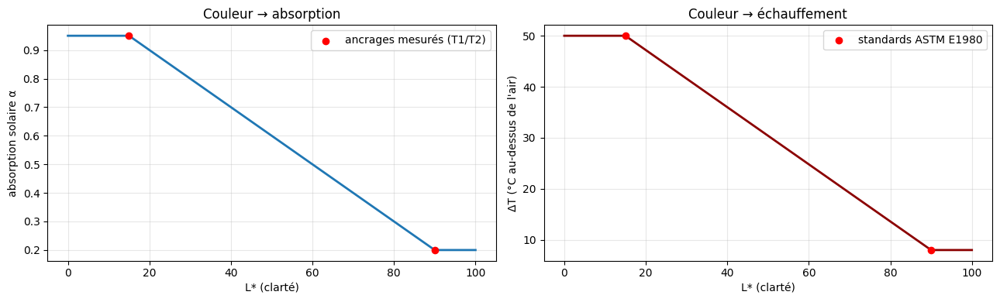

In [2]:
# --- Categories de teinte (bornes sur L*) ---
TEINTE_NOMS   = ["noir", "fonce", "moyen", "clair", "blanc"]
TEINTE_BORNES = [0, 20, 40, 60, 80, 100]     # 5 categories
TEINTE_COLORS = np.array([[20,20,20], [80,80,80], [140,140,140],
                          [200,200,200], [245,245,245]], dtype=np.uint8)

# --- Ancrages mesures (voir sources T1/T2) ---
L_NOIR,  ALPHA_NOIR  = 15.0, 0.95     # noir standard : rho=0.05
L_BLANC, ALPHA_BLANC = 90.0, 0.20     # blanc standard : rho=0.80
DT_NOIR,  DT_BLANC   = 50.0, 8.0      # ASTM E1980, conditions standard

def alpha_from_L(L):
    # Absorption solaire estimee a partir de la clarte L* (interpolation lineaire T1/T2)
    a = ALPHA_NOIR - (L - L_NOIR) / (L_BLANC - L_NOIR) * (ALPHA_NOIR - ALPHA_BLANC)
    return np.clip(a, ALPHA_BLANC, ALPHA_NOIR)

def dT_from_alpha(alpha):
    # Echauffement estime (degC au-dessus de l'air), interpolation ASTM E1980
    return DT_BLANC + (alpha - ALPHA_BLANC) / (ALPHA_NOIR - ALPHA_BLANC) * (DT_NOIR - DT_BLANC)

def teinte_from_L(L):
    return np.clip(np.digitize(L, TEINTE_BORNES[1:-1]), 0, 4).astype(np.uint8)

# --- Table de reference du modele ---
rows = []
for i, nom in enumerate(TEINTE_NOMS):
    lo, hi = TEINTE_BORNES[i], TEINTE_BORNES[i+1]
    Lm = (lo + hi) / 2
    a = float(alpha_from_L(np.array([Lm]))[0])
    rows.append(dict(teinte=nom, L_min=lo, L_max=hi, L_centre=Lm,
                     alpha=round(a, 2), reflectance=round(1-a, 2),
                     delta_T_degC=round(float(dT_from_alpha(np.array([a]))[0]), 1)))
df_model = pd.DataFrame(rows)
df_model.to_csv(OUTPUT_DIR / "modele_couleur_thermique.csv", index=False)
print("=== Modele couleur -> thermique ===")
print(df_model.to_string(index=False))

# --- Courbe du modele ---
Lg = np.linspace(0, 100, 200)
ag = alpha_from_L(Lg); dg = dT_from_alpha(ag)
fig, axes = plt.subplots(1, 2, figsize=(13, 4))
axes[0].plot(Lg, ag, lw=2)
axes[0].scatter([L_NOIR, L_BLANC], [ALPHA_NOIR, ALPHA_BLANC], color="red", zorder=5,
                label="ancrages mesurés (T1/T2)")
axes[0].set_xlabel("L* (clarté)"); axes[0].set_ylabel("absorption solaire α")
axes[0].set_title("Couleur → absorption"); axes[0].legend(); axes[0].grid(alpha=0.3)
axes[1].plot(Lg, dg, lw=2, color="darkred")
axes[1].scatter([L_NOIR, L_BLANC], [DT_NOIR, DT_BLANC], color="red", zorder=5,
                label="standards ASTM E1980")
axes[1].set_xlabel("L* (clarté)"); axes[1].set_ylabel("ΔT (°C au-dessus de l'air)")
axes[1].set_title("Couleur → échauffement"); axes[1].legend(); axes[1].grid(alpha=0.3)
plt.tight_layout(); fig.savefig(OUTPUT_DIR / "modele_courbes.png", dpi=150); plt.show()

## 3. Application aux 116 images

Pour chaque image : conversion CIELAB → `L*` → catégorie de teinte + α + ΔT. Reprise automatique.

In [4]:
for i, p in enumerate(image_paths, 1):
    f_t, f_a, f_d = (TEINTE_DIR / f"{p.stem}_teinte.png",
                     ALPHA_DIR / f"{p.stem}_alpha.npy",
                     DT_DIR / f"{p.stem}_dT.npy")
    if f_t.exists() and f_a.exists() and f_d.exists():
        continue
    bgr = cv2.imread(str(p))
    if bgr is None:
        continue
    rgb = cv2.cvtColor(bgr, cv2.COLOR_BGR2RGB).astype(np.float64) / 255.0
    L = rgb2lab(rgb)[..., 0]

    teinte = teinte_from_L(L)
    alpha  = alpha_from_L(L).astype(np.float32)
    dT     = dT_from_alpha(alpha).astype(np.float32)

    # exclusion du ciel
    sem = load_sem(p.stem)
    if sem is not None and sem.shape == L.shape:
        excl = np.isin(sem, list(EXCLUS)) | (sem == 255)
        alpha[excl] = np.nan
        dT[excl] = np.nan

    cv2.imwrite(str(f_t), teinte)
    np.save(f_a, alpha); np.save(f_d, dT)
    if i % 20 == 0 or i == len(image_paths):
        print(f"[{i}/{len(image_paths)}] {p.name}")

print(f"\nTeintes : {TEINTE_DIR}\nAlpha   : {ALPHA_DIR}\nDelta T : {DT_DIR}")

[80/116] GS017068[1]_equirect__f005040.jpg
[100/116] GS017069[1]_equirect__f008880.jpg
[116/116] GS017070[1]_equirect__f026040.jpg

Teintes : C:\Users\youss\Downloads\coolpath_local\data\outputs\color_thermal\teintes
Alpha   : C:\Users\youss\Downloads\coolpath_local\data\outputs\color_thermal\absorption
Delta T : C:\Users\youss\Downloads\coolpath_local\data\outputs\color_thermal\echauffement


## 4. Analyse thermique par classe sémantique

Quelles surfaces du quartier chauffent le plus **à cause de leur couleur** ?

=== Echauffement estime par classe (degC au-dessus de l'air) ===
       dT_moyen  dT_road  dT_sidewalk  dT_building  dT_vegetation
count     116.0    114.0        116.0        116.0          116.0
mean       29.7     22.6         25.3         25.2           33.8
std         4.1      8.9          8.0          6.7            4.1
min        21.2      8.0         12.1          9.8           21.5
25%        26.2     15.9         18.8         20.4           31.1
50%        29.6     20.6         23.1         25.5           33.4
75%        33.3     29.4         31.4         30.2           37.2
max        38.9     43.1         47.4         39.3           44.4

=== Composition de teinte par classe (%) ===
               noir  fonce  moyen  clair  blanc
road            0.6   21.0   11.1   48.5   18.9
sidewalk        2.1   29.3   16.7   24.7   27.3
building        3.4   18.2   32.8   27.3   18.3
wall            8.5   30.9   22.1   26.7   11.8
fence          16.5   35.3   21.7   18.1    8.3
pole   

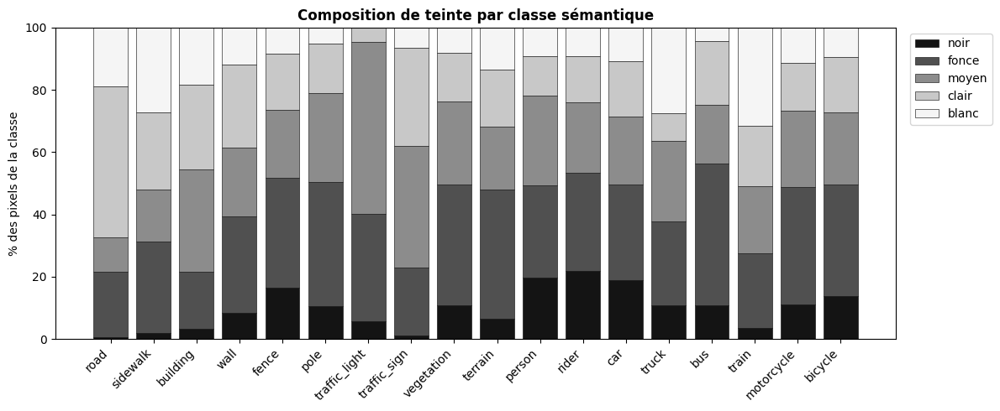

In [5]:
rows, teinte_cross = [], np.zeros((19, 5), dtype=np.int64)
for p in image_paths:
    f_a = ALPHA_DIR / f"{p.stem}_alpha.npy"
    if not f_a.exists():
        continue
    alpha = np.load(f_a); dT = np.load(DT_DIR / f"{p.stem}_dT.npy")
    teinte = cv2.imread(str(TEINTE_DIR / f"{p.stem}_teinte.png"), cv2.IMREAD_GRAYSCALE)
    sem = load_sem(p.stem)
    if sem is None or sem.shape != alpha.shape:
        continue
    v = (sem != 255) & np.isfinite(alpha)
    teinte_cross += np.bincount(sem[v].astype(np.int64) * 5 + teinte[v],
                                minlength=19 * 5).reshape(19, 5)
    r = dict(image=p.stem, alpha_moyen=round(float(np.nanmean(alpha)), 3),
             dT_moyen=round(float(np.nanmean(dT)), 1))
    for cid, nom in ((0, "road"), (1, "sidewalk"), (2, "building"), (8, "vegetation")):
        m = (sem == cid) & np.isfinite(alpha)
        r[f"dT_{nom}"] = round(float(dT[m].mean()), 1) if m.sum() > 500 else None
    rows.append(r)

df = pd.DataFrame(rows)
df.to_csv(OUTPUT_DIR / "thermique_par_image.csv", index=False)
print("=== Echauffement estime par classe (degC au-dessus de l'air) ===")
print(df[[c for c in df.columns if c.startswith("dT_")]].describe().round(1).to_string())

# Composition de teinte par classe
tc_pct = teinte_cross / np.maximum(teinte_cross.sum(1, keepdims=True), 1) * 100
present = [c for c in range(19) if teinte_cross[c].sum() > 0]
df_t = pd.DataFrame(tc_pct[present].round(1), index=[CITYSCAPES_ORDER[c] for c in present],
                    columns=TEINTE_NOMS)
df_t.to_csv(OUTPUT_DIR / "teintes_par_classe.csv")
print("\n=== Composition de teinte par classe (%) ===")
print(df_t.to_string())

fig, ax = plt.subplots(figsize=(12, 5))
bottom = np.zeros(len(present))
for k, nom in enumerate(TEINTE_NOMS):
    ax.bar([CITYSCAPES_ORDER[c] for c in present], tc_pct[present, k], bottom=bottom,
           color=TEINTE_COLORS[k]/255.0, edgecolor="black", linewidth=0.4, label=nom)
    bottom += tc_pct[present, k]
ax.set_ylabel("% des pixels de la classe"); ax.legend(bbox_to_anchor=(1.01, 1), loc="upper left")
ax.set_title("Composition de teinte par classe sémantique", fontweight="bold")
plt.xticks(rotation=45, ha="right"); plt.tight_layout()
fig.savefig(OUTPUT_DIR / "teintes_par_classe.png", dpi=150); plt.show()

## 5. **Démonstration clé : même matériau, couleurs différentes**

C'est le résultat central du notebook. Pour un **même matériau BFMS**, on compare l'échauffement estimé entre ses pixels clairs et ses pixels sombres. L'écart mesuré est l'effet **propre à la couleur**, matériau constant.

=== EFFET DE LA COULEUR A MATERIAU CONSTANT ===
(ecart d'echauffement entre les pixels sombres et clairs du MEME materiau)

             materiau    pixels teinte_plus_claire  dT_claire teinte_plus_sombre  dT_sombre  ecart_degC
         Rubber/Latex     85185              blanc        8.2               noir       49.3        41.1
         Fabric/Cloth  16112850              blanc        9.5               noir       49.7        40.2
                Metal   1770840              blanc        9.8               noir       49.4        39.6
           Background 308874742              blanc       10.0               noir       49.3        39.3
              Foliage  85369997              blanc        9.8               noir       49.1        39.3
              Asphalt    819428              blanc        8.9               noir       48.0        39.1
                Glass   2321339              blanc       10.4               noir       49.2        38.8
            Skin/Lips  10347198             

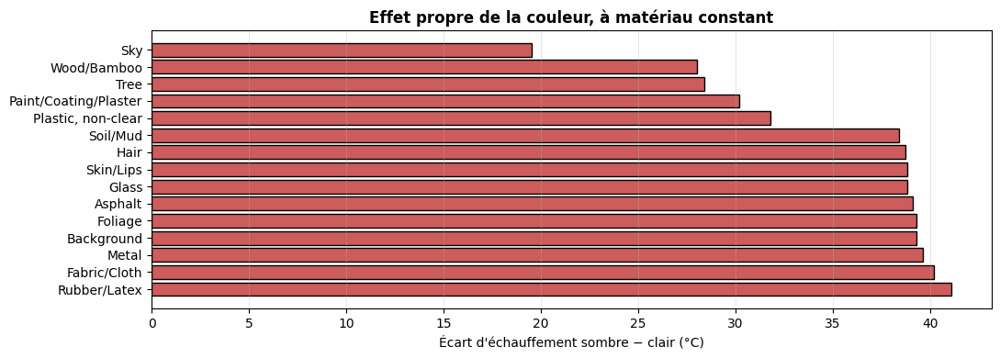

In [6]:
BFMS_ID2LABEL = {
    0:"Background",1:"Wood/Bamboo",2:"Ground tile",3:"Brick",4:"Cardboard/Paper",
    5:"Tree",6:"Roof tile",7:"Ceramic",8:"Chalkboard/Blackboard",9:"Asphalt",
    10:"Cement/Concrete",11:"Composite decorative board",12:"Rammed earth",
    13:"Fabric/Cloth",14:"Water",15:"Windows with metal fences",16:"Foliage",
    17:"Food",18:"Fur",19:"Pottery",20:"Glass",21:"Hair",
    22:"Roofing waterproof material",23:"Ice",24:"Leather",25:"Carved brick",
    26:"Metal",27:"Mirror",28:"Enamel",29:"Paint/Coating/Plaster",30:"Window screen",
    31:"Whiteboard",32:"Photograph/Painting/Airbrushed fabric",33:"Plastic, clear",
    34:"Plastic, non-clear",35:"Rubber/Latex",36:"Sand",37:"Skin/Lips",
    38:"Sky",39:"Snow",40:"Engineered Stone/Imitation Stone",41:"Soil/Mud",42:"Natural Stone",
}
BFMS_NAMES = [BFMS_ID2LABEL[i] for i in range(43)]

sum_dT = np.zeros((43, 5)); cnt = np.zeros((43, 5), dtype=np.int64)
for p in image_paths:
    f_a = ALPHA_DIR / f"{p.stem}_alpha.npy"
    f_b = BFMS_DIR / f"{p.stem}_bfms.png"
    if not (f_a.exists() and f_b.exists()):
        continue
    dT = np.load(DT_DIR / f"{p.stem}_dT.npy")
    teinte = cv2.imread(str(TEINTE_DIR / f"{p.stem}_teinte.png"), cv2.IMREAD_GRAYSCALE)
    bfms = cv2.imread(str(f_b), cv2.IMREAD_GRAYSCALE)
    if bfms.shape != dT.shape:
        continue
    v = np.isfinite(dT)
    idx = bfms[v].astype(np.int64) * 5 + teinte[v]
    np.add.at(sum_dT.ravel(), idx, dT[v])
    np.add.at(cnt.ravel(), idx, 1)

mean_dT = np.divide(sum_dT, cnt, out=np.full_like(sum_dT, np.nan), where=cnt > 0)

res = []
for m in range(43):
    if cnt[m].sum() < 50000:          # materiaux suffisamment presents
        continue
    valid = np.where(cnt[m] > 5000)[0]
    if len(valid) < 2:
        continue
    res.append(dict(
        materiau=BFMS_NAMES[m], pixels=int(cnt[m].sum()),
        teinte_plus_claire=TEINTE_NOMS[valid.max()],
        dT_claire=round(mean_dT[m, valid.max()], 1),
        teinte_plus_sombre=TEINTE_NOMS[valid.min()],
        dT_sombre=round(mean_dT[m, valid.min()], 1),
        ecart_degC=round(mean_dT[m, valid.min()] - mean_dT[m, valid.max()], 1)))

df_demo = pd.DataFrame(res).sort_values("ecart_degC", ascending=False)
df_demo.to_csv(OUTPUT_DIR / "effet_couleur_par_materiau.csv", index=False)
print("=== EFFET DE LA COULEUR A MATERIAU CONSTANT ===")
print("(ecart d'echauffement entre les pixels sombres et clairs du MEME materiau)\n")
print(df_demo.to_string(index=False))

if len(df_demo):
    fig, ax = plt.subplots(figsize=(11, 4))
    ax.barh(df_demo["materiau"], df_demo["ecart_degC"], color="indianred", edgecolor="black")
    ax.set_xlabel("Écart d'échauffement sombre − clair (°C)")
    ax.set_title("Effet propre de la couleur, à matériau constant", fontweight="bold")
    ax.grid(alpha=0.3, axis="x")
    plt.tight_layout(); fig.savefig(OUTPUT_DIR / "effet_couleur.png", dpi=150); plt.show()

## 6. Visualisation

Original | catégories de teinte | échauffement estimé (ciel exclu).

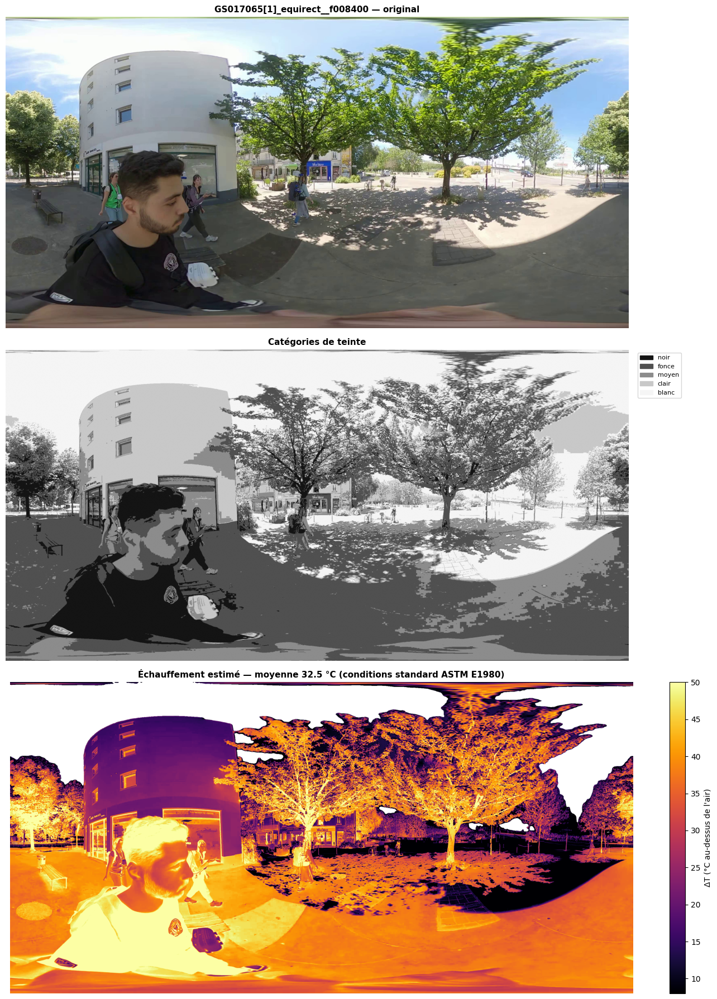

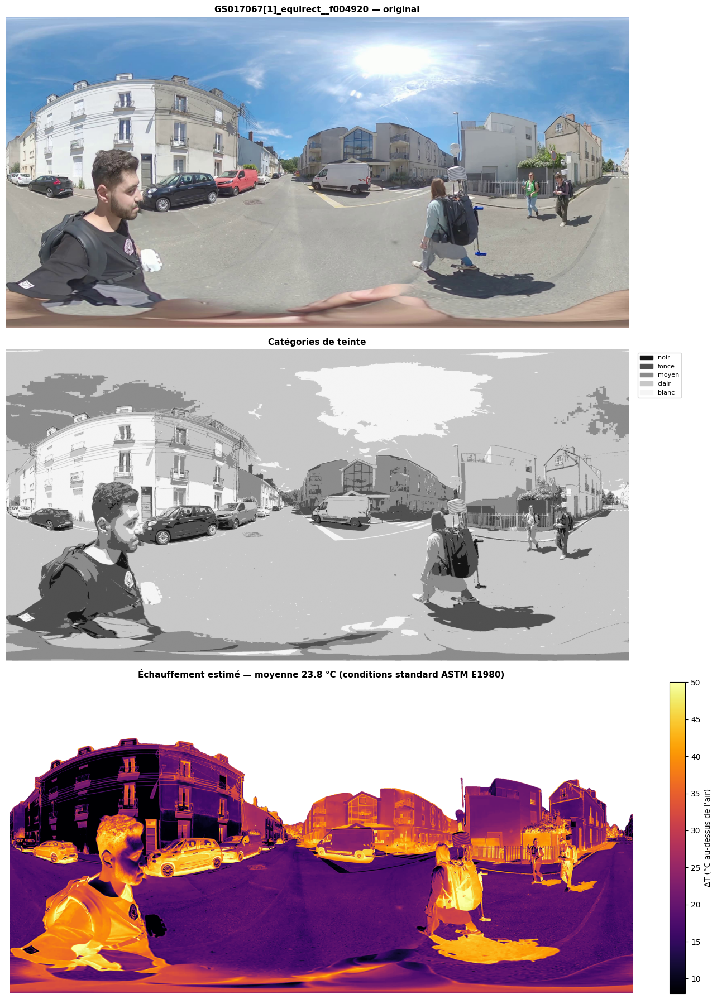

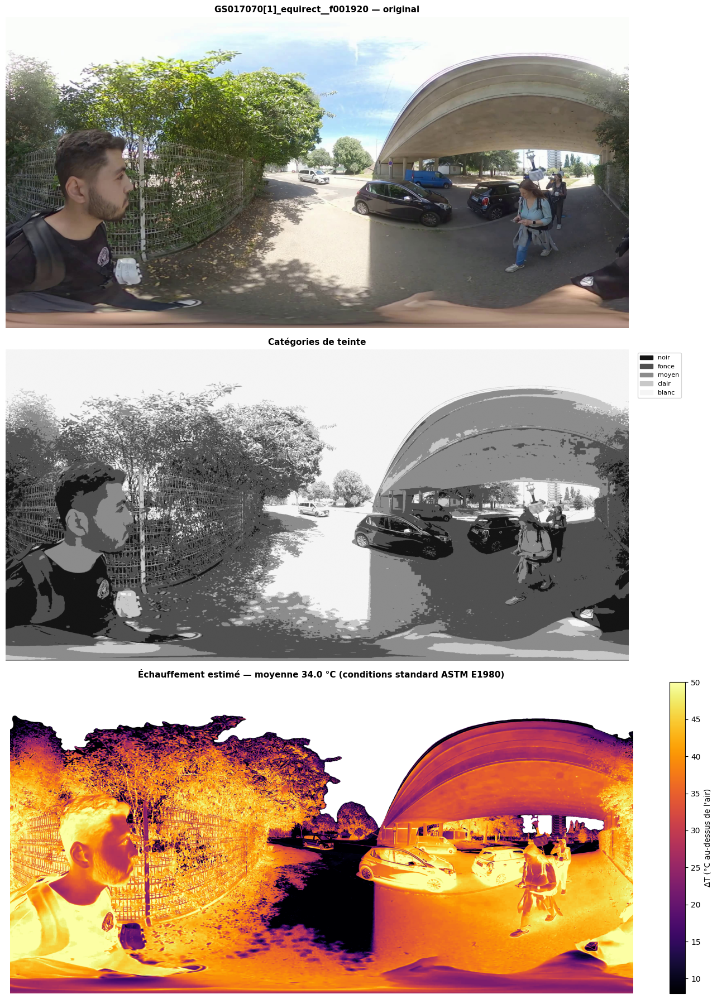

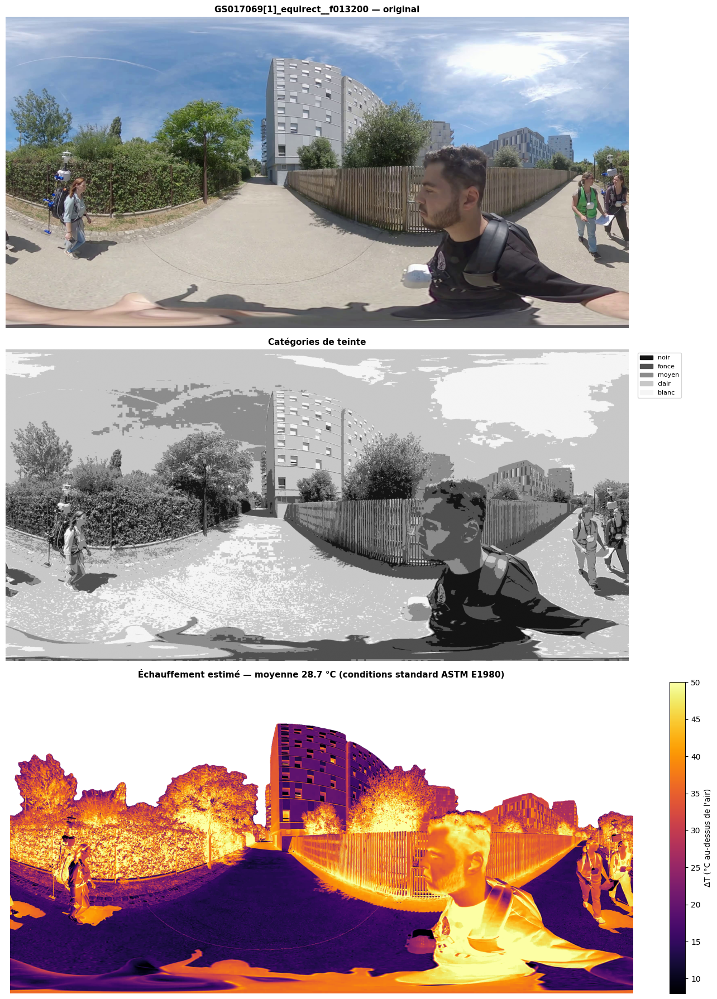

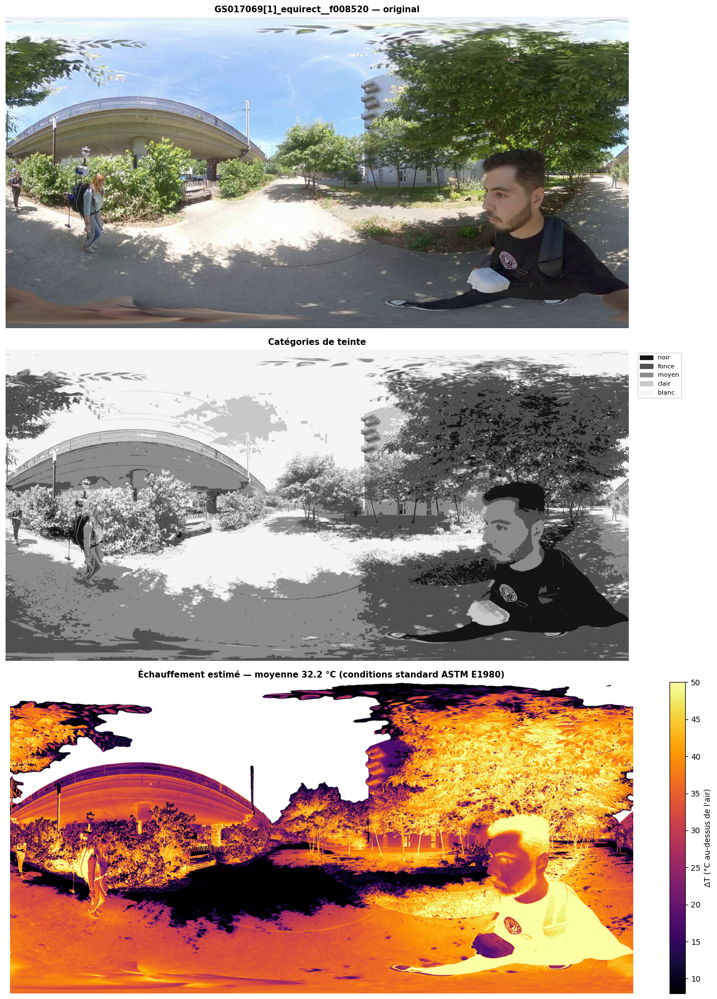

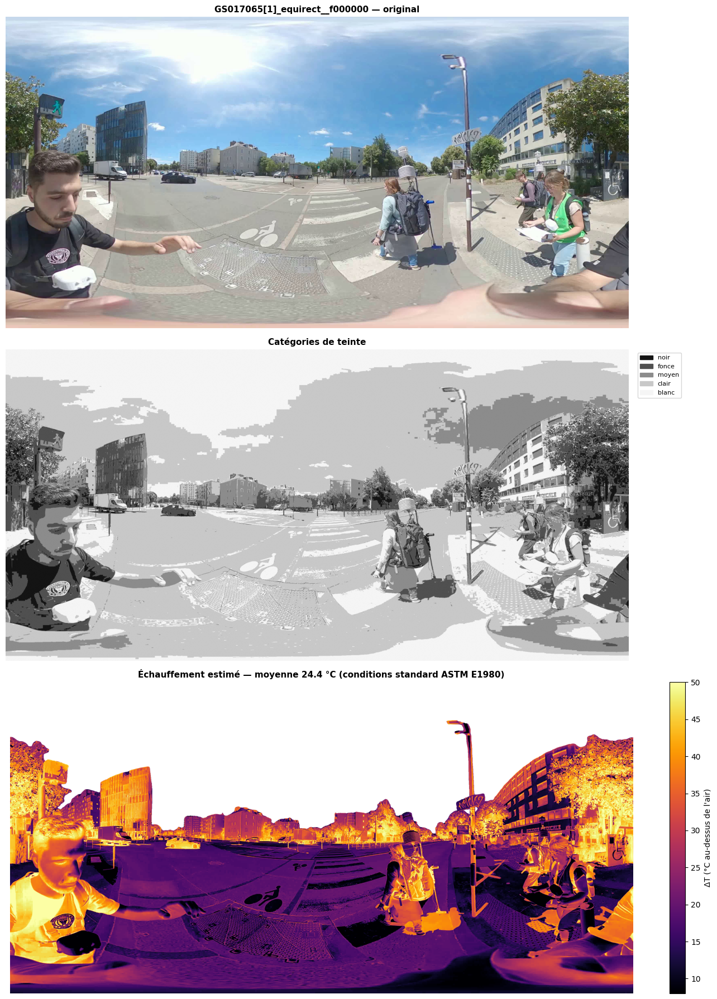

Visualisations : C:\Users\youss\Downloads\coolpath_local\data\outputs\color_thermal\viz


In [7]:
cmap_t = ListedColormap(TEINTE_COLORS / 255.0)
norm_t = BoundaryNorm(range(6), 5)
cmap_dT = plt.get_cmap("inferno").copy(); cmap_dT.set_bad("white")

for p in random.Random(1).sample(image_paths, min(6, len(image_paths))):
    f_t = TEINTE_DIR / f"{p.stem}_teinte.png"
    if not f_t.exists():
        continue
    rgb = cv2.cvtColor(cv2.imread(str(p)), cv2.COLOR_BGR2RGB)
    teinte = cv2.imread(str(f_t), cv2.IMREAD_GRAYSCALE)
    dT = np.load(DT_DIR / f"{p.stem}_dT.npy")

    fig, axes = plt.subplots(3, 1, figsize=(14, 18))
    axes[0].imshow(rgb); axes[0].set_title(f"{p.stem} — original", fontweight="bold", fontsize=11)

    axes[1].imshow(teinte, cmap=cmap_t, norm=norm_t)
    axes[1].legend(handles=[Patch(color=TEINTE_COLORS[k]/255.0, label=TEINTE_NOMS[k])
                            for k in range(5)],
                   bbox_to_anchor=(1.01, 1), loc="upper left", fontsize=8)
    axes[1].set_title("Catégories de teinte", fontweight="bold", fontsize=11)

    im = axes[2].imshow(np.ma.masked_invalid(dT), cmap=cmap_dT, vmin=8, vmax=50)
    axes[2].set_title(f"Échauffement estimé — moyenne {np.nanmean(dT):.1f} °C "
                      f"(conditions standard ASTM E1980)", fontweight="bold", fontsize=11)
    plt.colorbar(im, ax=axes[2], fraction=0.025, label="ΔT (°C au-dessus de l'air)")

    for ax in axes:
        ax.axis("off")
    plt.tight_layout()
    plt.savefig(VIZ_DIR / f"{p.stem}_thermique.png", dpi=95, bbox_inches="tight")
    plt.show()

print(f"Visualisations : {VIZ_DIR}")

## 7. Limites — **à présenter avec les résultats**

**1. Les « couleurs froides » (cool colors) cassent la relation couleur → thermique**
Des pigments réfléchissant le proche infrarouge permettent à une peinture **visuellement noire** (L* ≤ 20) d'avoir une réflectance solaire totale de **plus de 30 %** au lieu de 5 % (T4). Le modèle la classerait « noir » et surestimerait fortement son échauffement. Impossible à détecter en RGB.

**2. Métamérisme : deux couleurs identiques, thermiques opposées**
Deux surfaces de **même couleur rose** perçue peuvent différer de **47,6 °C** sous le soleil (T5). La couleur visible ne détermine donc pas à elle seule le comportement thermique.

**3. Les ombres sont interprétées comme des couleurs sombres**
Un mur blanc à l'ombre a un `L*` bas → classé « foncé » → échauffement surestimé. C'est la limite de toute méthode travaillant sur les pixels bruts.

**4. Conditions standard ≠ conditions réelles**
Les ΔT sont calculés sous les hypothèses ASTM E1980 (1000 W/m², vent faible, ε=0,90, régime stationnaire). Une rue de Nantes en juillet, avec ombrage partiel, vent et inertie thermique, donnera des valeurs différentes. **Les résultats sont comparatifs entre surfaces, pas prédictifs en absolu.**

**5. L'émissivité n'est pas modélisée**
ΔT dépend aussi de l'émissivité ε (capacité à réémettre en infrarouge), ici supposée constante à 0,90. Un métal nu (ε ≈ 0,05–0,25) chauffe beaucoup plus que ne le prédit ce modèle à absorption égale.

**6. Interpolation linéaire entre deux ancrages**
La relation L* → α est une droite entre blanc et noir standard, pas une courbe mesurée sur un panel de teintes. Ramos et al. (T2) donnent 0,80–0,95 pour brun/gris/noir, cohérent avec le modèle, mais un calage sur plus de points le rendrait plus solide.

**Recommandation** : valider ces estimations sur quelques mesures thermographiques réelles (caméra IR) de surfaces du quartier Dalby, en notant leur couleur — ce serait à la fois une validation et une contribution originale au projet.